# Site by site analysis
This notebook walks through fitting of atomic columns in a STEM image, identification of sublattices, calculation of intercolumn correlation functions, measurement of intercolumn distances and angles and line profiles, and visualization utilities for overlaying local parameters on STEM images.

The processing is done on an image of a double perovskite thin film grown on a perovskite substrate with large octahedral tilts, giving different interesting local structures on either side of the interface.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import skimage
from tifffile import imread
import kemstem
%matplotlib widget
print(f'{kemstem.__version__=}')

kemstem.__version__='0.0.4'


# Data loading and preprocessing
We begin by loading an atomic resolution HAADF STEM image of our film, and performing some basic preprocessing before beginning analysis. Here, the intensity is normalized between 0 and 1 for interpretability.

Image shape (1017, 1017)
Normalized to min: 0.0, max: 1.0


(-0.5, 1016.5, 1016.5, -0.5)

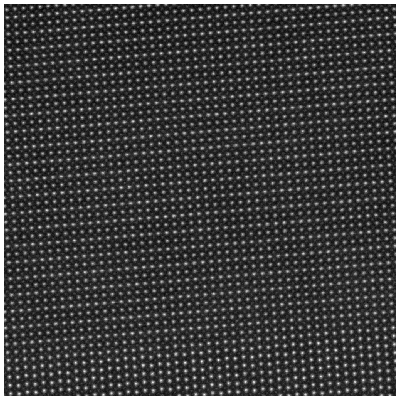

In [3]:
filename = '/Users/noahschnitzer/Documents/kem/data/20230629_SBMOon110DSO_RT/velox/tiffs/registered/rI_2138 B1_RT 5.3 Mx_0_HAADF.tif'
image = imread(filename)
print(f'Image shape {image.shape}')
image = kemstem.util.normalize(image)
print(f'Normalized to min: {image.min()}, max: {image.max()}')

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
ax.matshow(image,cmap='gray')
ax.axis('off')

# Finding and fitting atomic columns
We begin by finding the column positions using an approach derived from stemtool.

In [86]:
blurred_image = gaussian_filter(image,.5) # pre-blurring slightly to reduce noise and get more gaussian shaped columns

4405 columns found


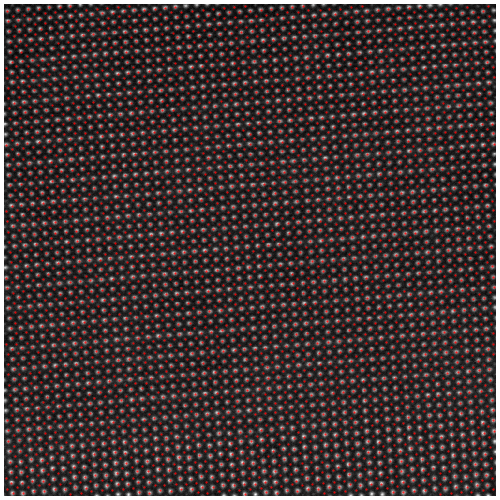

In [87]:
distance = 4
threshold = .1
c0 = kemstem.find_columns(blurred_image,distance=distance, threshold=threshold) # 8 .2

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(5,5))
ax.matshow(blurred_image,cmap='gray')
ax.axis('off')
ax.plot(c0[:,1],c0[:,0],'r.',markersize=1)
print(f'{c0.shape[0]} columns found')

Next, we test fitting a single atomic column. The test column is selected with `test_it`, the key parameter is the fit window size, set with `window_dim`. It can be useful to preprocess the image to aid in fitting, though the precise approach will depend strongly on details of the image and precision considerations. Here we use the blurred image calculated previously.

The figure generated by this cell shows:
* The patch of image data being fit in the top left
* The fit result in the top right (should look as similar as possible to the top left)
* A larger area of the image in the bottom left, marked with the original and refined positions in blue and red.
* The fit residual, which should be as small and flat as possible.

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 59.22it/s]


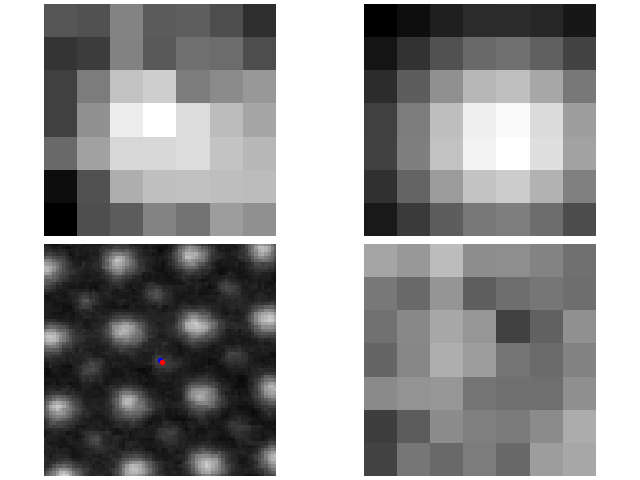

In [22]:
test_it = 3500
window_dim = 7
cf,errs,opts,data_fits = kemstem.refine_columns(blurred_image,c0[test_it,:],window_dim)

visualization_window = 5*window_dim
fig,ax = plt.subplots(2,2,constrained_layout=True)
ax[0,0].matshow(data_fits[:,:,0,0],cmap='gray')
ax[0,1].matshow(data_fits[:,:,0,1],cmap='gray')
ax[1,0].matshow(blurred_image,cmap='gray')
ax[1,0].plot(c0[test_it,1],c0[test_it,0],'b.') # original unfit position shown in blue
ax[1,0].plot(cf[0,1],cf[0,0],'r.') # fit position shown in red
ax[1,0].set_xlim([c0[test_it,1]-visualization_window,c0[test_it,1]+visualization_window])
ax[1,0].set_ylim([c0[test_it,0]+visualization_window,c0[test_it,0]-visualization_window])
ax[1,1].matshow(data_fits[:,:,0,0]-data_fits[:,:,0,1],cmap='gray',vmin=-.1,vmax=.1) # fit residual
_ = [tax.axis('off') for tax in ax.ravel()]

The following cell will now fit each column identified in the original image. This may take some time.

In [24]:
cf,errs,opts,data_fits = kemstem.refine_columns(blurred_image,c0,window_dim)

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 4405/4405 [00:29<00:00, 150.17it/s]


The fit results are shown below

(-0.5, 1016.5, 1016.5, -0.5)

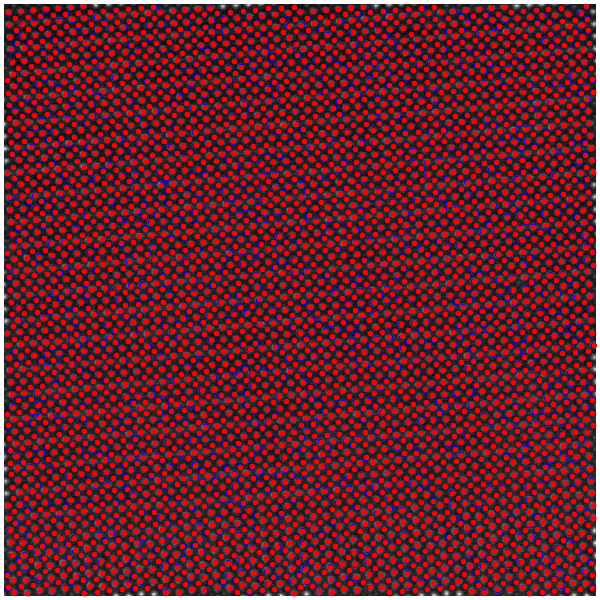

In [88]:
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(6,6))
ax.matshow(image,cmap='gray')
ax.plot(c0[:,1],c0[:,0],'b.') # original positions shown in blue
ax.plot(cf[:,1],cf[:,0],'r.') # fit positions shown in red
ax.axis('off')

# Separating sublattices
Now that we've precicely fit each atomic column with a Gaussian, we can separate out the "A" and "B" sublattices of the perovskite structure.

In this image the atomic numbers of the A and B sites are very different in both the substrate and film, so the sublattices can be separated just from the HAADF intensity.

Below, a histogram of the fit column intensities (the sum of the Gaussian amplitude and its background) is plotted

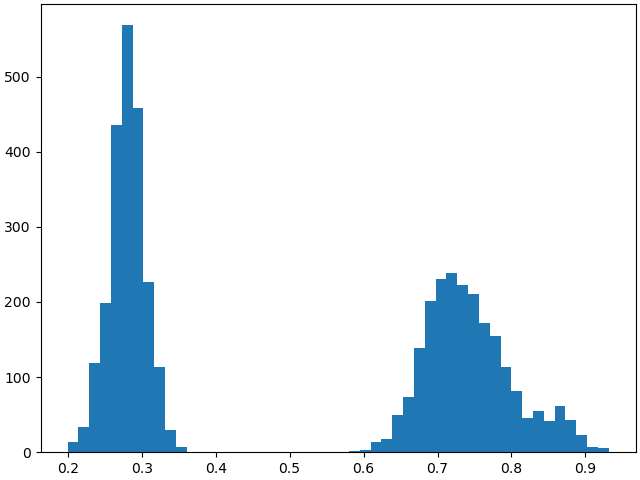

In [26]:
column_intensity = opts[:,0] + opts[:,-1]
fig,ax = plt.subplots(1,1,constrained_layout=True)
_ = ax.hist(column_intensity,bins=50)

The sublattices show a clear separation in intensity, so we can assign the sites as either A or B just by picking a threshold value for the column intenisty.

In [27]:
A = column_intensity > .45
B = ~A

The `A` variable is a boolean ndarray with a value of `True` where the intensity is greater than the threshold - i.e. at the A sites of the structure. Because all the identified columns are either A or B sites, we assign `B` to simply be the complement of `A`.

The resulting labeled A and B sites are plotted below in green and purple respectively

(-0.5, 1016.5, 1016.5, -0.5)

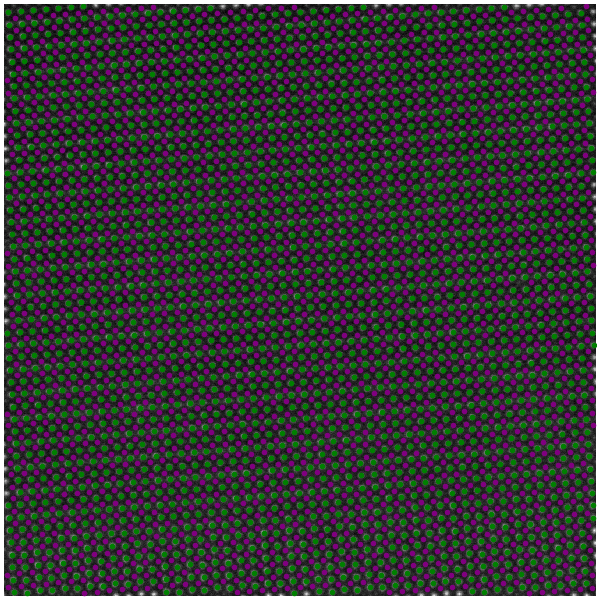

In [89]:
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(6,6))
ax.matshow(image,cmap='gray')
ax.plot(cf[A,1],cf[A,0],'g.') 
ax.plot(cf[B,1],cf[B,0],'.',color='purple')
ax.axis('off')

We can use these `A` and `B` variables to index in to other variables to perform calculations or visualize one specific sublattice.

Below, the column intensities of only the A sublattice (left) and B sublattice (right) are plotted using the `kemstem.plot_scalar_sites` function, which generates a scatter plot with color corresponding to a scalar variable at each column position.

(-0.5, 1016.5, 1016.5, -0.5)

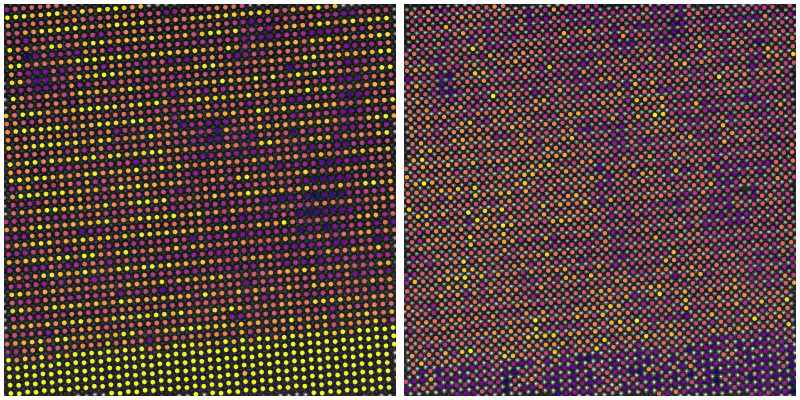

In [32]:
fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,4))
ax[0].matshow(image,cmap='gray')
kemstem.plot_scalar_sites(ax[0],column_intensity[A],cf[A,:],vmin=.6,vmax=.8,cmap='plasma')
ax[0].axis('off')

ax[1].matshow(image,cmap='gray')
kemstem.plot_scalar_sites(ax[1],column_intensity[B],cf[B,:],vmin=.2,vmax=.35,cmap='plasma')
ax[1].axis('off')

# Calculating correlation functions

Pair correlation functions, which describe the atomic "neighborhood" surrounding a site, can be calculated with the `kemstem.get_neighborhood` function.

This function calculates the vectors from a set of origin points to a set of destination points, which may or may not include the origins. This is useful to for instance calculate the pair correlations between different sublattices. For instance below, the pair correlations of the A sublattice with respect to itself `cf_AA`, and of the A sublattice with respect to the B sublattice `cf_AB` are both calculated, each with the A sites as the origin. 

Plotting out these two correlation functions shows the atomic network surrounding each A site, and the distribution of positions associated with each site.

Here, for instance, a vertical splitting of the A sites (green) is clearly visible associated with the octahedral tilts present in the substrate.

(75.0, -75.0)

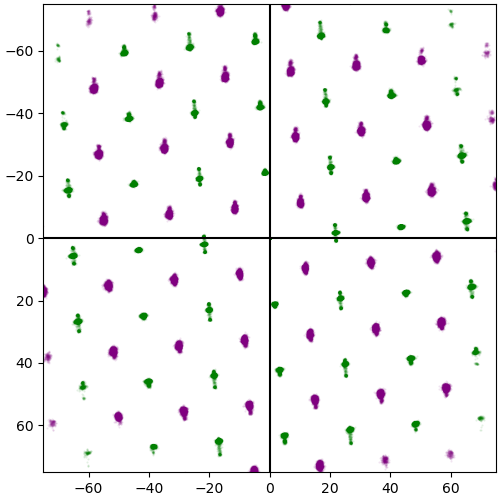

In [90]:
# k is the number of nearest neighbor points to consider
cf_AA = kemstem.get_neighborhood(cf[A,:],cf[A,:],k=40)
cf_AB = kemstem.get_neighborhood(cf[B,:],cf[A,:],k=40)

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(5,5))
ax.plot(cf_AA[:,1],cf_AA[:,0],'.',alpha=.1,markersize=1,color='green')
ax.plot(cf_AB[:,1],cf_AB[:,0],'.',alpha=.1,markersize=1,color='purple')
ax.axhline(y=0,color='k')
ax.axvline(x=0,color='k')
extent = 75
ax.set_xlim([-extent,extent])
ax.set_ylim([extent,-extent])
#ax.invert_yaxis()

#ax.axis('scaled')

These pair correlation functions provide a convenient basis for identifying and selecting vectors of interest for measuring quantities like inter column distance, angles, and polarization.

Below, the pair correlation function centered on the A sites with respect to all other sites is calculated, and clustered with K-means.

<AxesSubplot:>

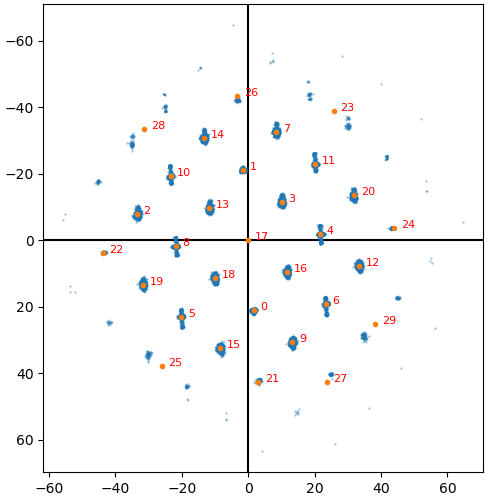

In [92]:
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(5,5))
neighborhood = kemstem.get_neighborhood(cf[:,:],cf[A,:],k=20)
clusters = kemstem.cluster_neighbors(neighborhood,n_clusters=30)
kemstem.neighborhood_scatter_plot(neighborhood,clusters=clusters,ax=ax)



These clusters can be used to select appoximate vectors to sites of interest. Below,  the in-plane (`guess_1`) and out of plane (`guess_2`) vectors are hard coded (because cluster order will depend on insignificant parameter changes) but can easily be selected as shown in the commented lines. 

In addiiton vectors to the 4 nearest neighbors (`guess_NNs`), here, the B-sites, are also stored.

In [93]:
#guess_1 = clusters[4,:]
guess_1 = np.array([-2.02132484, 21.71933733])

#guess_2 = clusters[1,:]
guess_2 = np.array([-21.12561539,  -1.61540598])

#guess_NNs = [clusters[20,:],clusters[17,:],clusters[8,:],clusters[11,:],]
guess_NNs = [np.array([-11.55337437,  10.10028533]),
 np.array([ 9.56627931, 11.71652282]),
 np.array([ 10.88326527, -10.10667026]),
 np.array([ -9.69805179, -11.63272855])]


# Measuring inter-column distances and angles
From these "guess" vectors which reflect averages across the whole field of view, we can identify the actual vectors from each site to its neighbor using the `kemstem.get_vector_to_neighbors` function. This function also involves a mapping from a set of origins to a set of destinations, returning the vector from each origin point to the destination point closest to `origin + guess vector`.

Here, we pass in all columns for both origins and destinations, so the resulting sets of vectors will include both the A and B sublattices. The shape and order of the resulting in-plane (`v1`) and out of plane (`v2`) vectors are the same as the original sites, so the variables used to index the A and B sublattices (`A` and `B`) can also be used to index these arrays.

If instead only the vectors from or to a specific sublattice are desired, only those points should be passed in as arguments (e.g. as used to calcualte `v_AtoBs` and `v_BtoAs`). 

In [95]:
v1 = kemstem.get_vector_to_neighbors(cf,cf,guess_1,threshold=3)
v2 = kemstem.get_vector_to_neighbors(cf,cf,guess_2,threshold=3)

v_AtoBs = np.array([kemstem.get_vector_to_neighbors(cf[B,:],cf[A,:],gb,threshold=3) for gb in guess_NNs])
v_BtoAs = np.array([kemstem.get_vector_to_neighbors(cf[A,:],cf[B,:],gb,threshold=3) for gb in guess_NNs])

# lengths of v1 and v2
l_v1 = np.linalg.norm(v1,axis=1)
l_v2 = np.linalg.norm(v2,axis=1)

# angles of v1 and v2 - converted to degrees and relative to the cartesian image axes
a_v1 = np.arctan2(v1[:,0],v1[:,1])*180/np.pi
a_v2 = np.arctan2(v2[:,0],v2[:,1])*180/np.pi

Below the histogram of in plane vector lengths is shown.

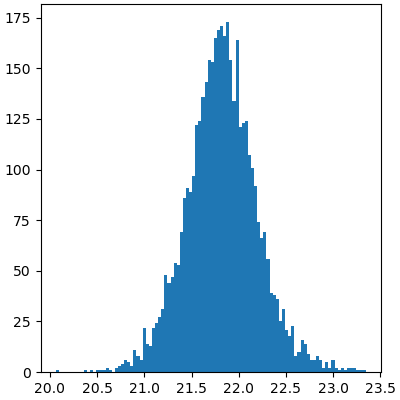

In [42]:
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
_ = ax.hist(l_v1,bins=100)

Below maps of:
- Upper left - in plane A-A vector length
- Upper right - out-of-plane A-A vector length - showing difference in out of plane lattice constant in the substrate vs film
- Bottom left - in plane B-B vector length
- Bottom right - out of plane B-B vector length - showing alternation associated with double perovskite structure int he film
are plotted with the `plot_scalar_bonds` function, which plots a line from one point to another colored according to a scalar value. Here, the lines are used to convey the lengths being measured.

(-0.5, 1016.5, 1016.5, -0.5)

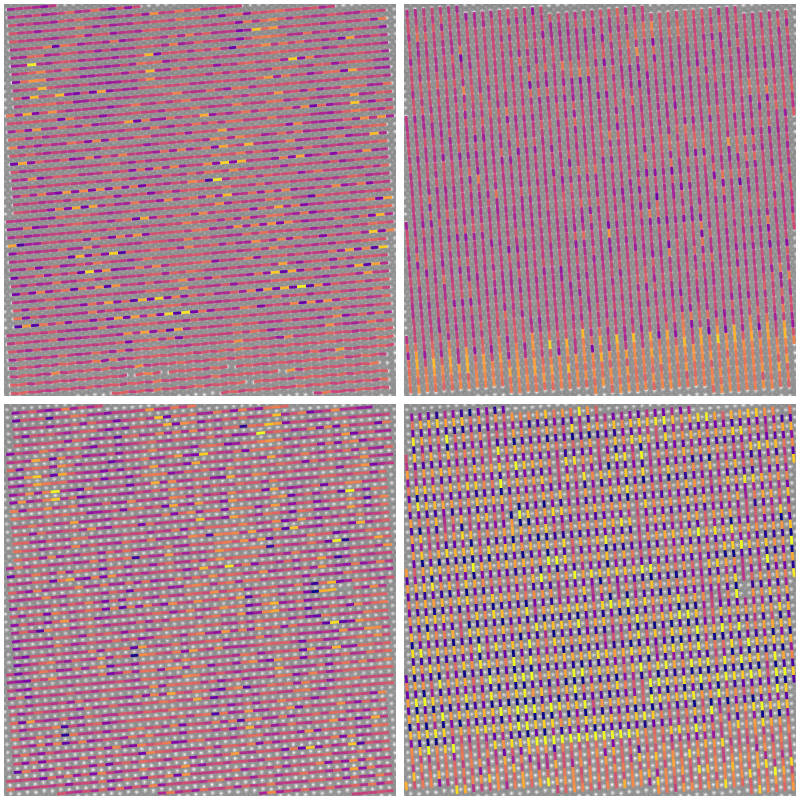

In [43]:
l_v1_cent = np.nanmean(l_v1)
l_v2_cent = np.nanmean(l_v2)
l_spread = 1.5
cmap = 'plasma'

fig,ax = plt.subplots(2,2,constrained_layout=True,figsize=(8,8),sharex=True,sharey=True)
ax[0,0].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[0,0],l_v1[A],cf[A,:],cf[A,:]+v1[A,:],cmap=cmap,vmin=l_v1_cent-l_spread,vmax=l_v1_cent+l_spread,linewidth=2)
ax[0,0].axis('off')
ax[0,1].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[0,1],l_v2[A],cf[A,:],cf[A,:]+v2[A,:],cmap=cmap,vmin=l_v2_cent-l_spread,vmax=l_v2_cent+l_spread,linewidth=2)
ax[0,1].axis('off')


ax[1,0].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[1,0],l_v1[B],cf[B,:],cf[B,:]+v1[B,:],cmap=cmap,vmin=l_v1_cent-l_spread,vmax=l_v1_cent+l_spread,linewidth=2)
ax[1,0].axis('off')
ax[1,1].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[1,1],l_v2[B],cf[B,:],cf[B,:]+v2[B,:],cmap=cmap,vmin=l_v2_cent-l_spread,vmax=l_v2_cent+l_spread,linewidth=2)
ax[1,1].axis('off')


Histogram of A site in plane angles

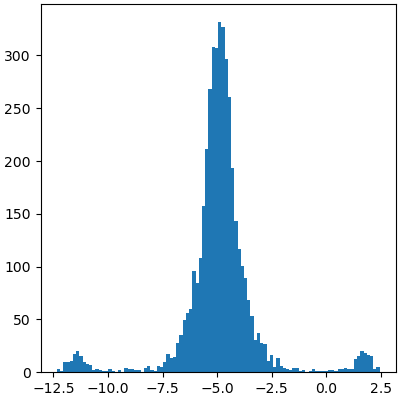

In [44]:
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
_ = ax.hist(a_v1,bins=100)

Below maps of:
- Upper left - in plane A-A vector angle - showing alternating octahedral tilts in the DyScO3 substrate
- Upper right - out-of-plane A-A vector angle 
- Bottom left - in plane B-B vector angle
- Bottom right - out of plane B-B vector angle 
likewise plotted with the `plot_scalar_bonds` function.

(-0.5, 1016.5, 1016.5, -0.5)

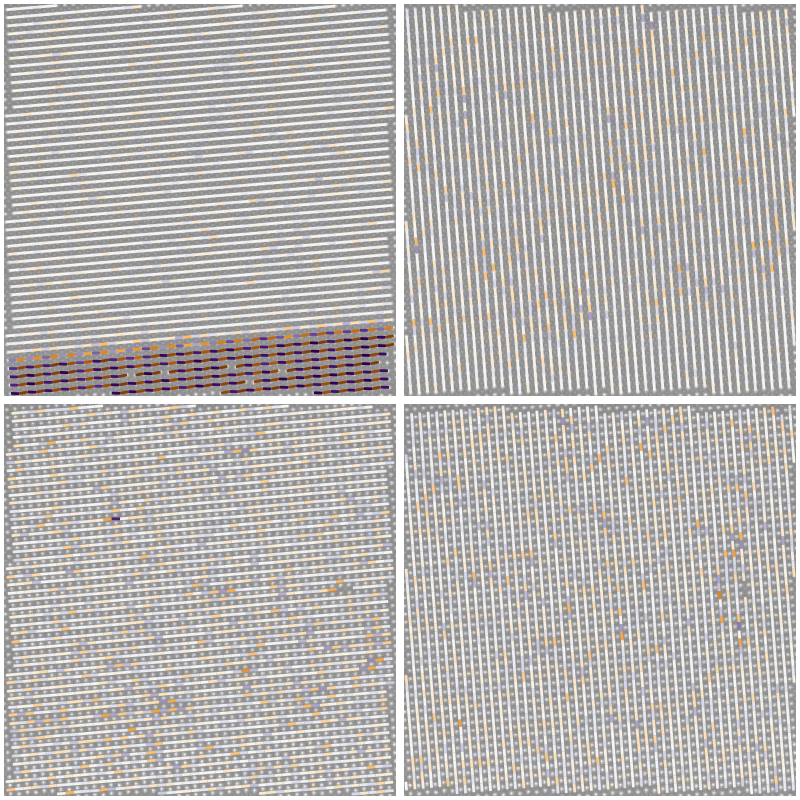

In [45]:
a_v1_cent = np.nanmean(a_v1)
a_v2_cent = np.nanmean(a_v2)
a_spread = 7

fig,ax = plt.subplots(2,2,constrained_layout=True,figsize=(8,8),sharex=True,sharey=True)
ax[0,0].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[0,0],a_v1[A],cf[A,:],cf[A,:]+v1[A,:],cmap='PuOr',vmin=a_v1_cent-a_spread,vmax=a_v1_cent+a_spread,linewidth=2)
ax[0,0].axis('off')
ax[0,1].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[0,1],a_v2[A],cf[A,:],cf[A,:]+v2[A,:],cmap='PuOr',vmin=a_v2_cent-a_spread,vmax=a_v2_cent+a_spread,linewidth=2)
ax[0,1].axis('off')

ax[1,0].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[1,0],a_v1[B],cf[B,:],cf[B,:]+v1[B,:],cmap='PuOr',vmin=a_v1_cent-a_spread,vmax=a_v1_cent+a_spread,linewidth=2)
ax[1,0].axis('off')
ax[1,1].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_bonds(ax[1,1],a_v2[B],cf[B,:],cf[B,:]+v2[B,:],cmap='PuOr',vmin=a_v2_cent-a_spread,vmax=a_v2_cent+a_spread,linewidth=2)
ax[1,1].axis('off')


In addition to visualization with points representing sites or lines representing vectors or bonds, arbitrary polygons can also be plotted to reflect crystallographically significant features. E.g. below, the A and B column intensities are plotted on quadrilaterals defined by the B and A sublattices (i.e., A site intensity is plotted on ~squares with corners at each neighboring B sites). This can be useful to represent unit cell shapes, octahedra / tetrahedra, etc.

(-0.5, 1016.5, 1016.5, -0.5)

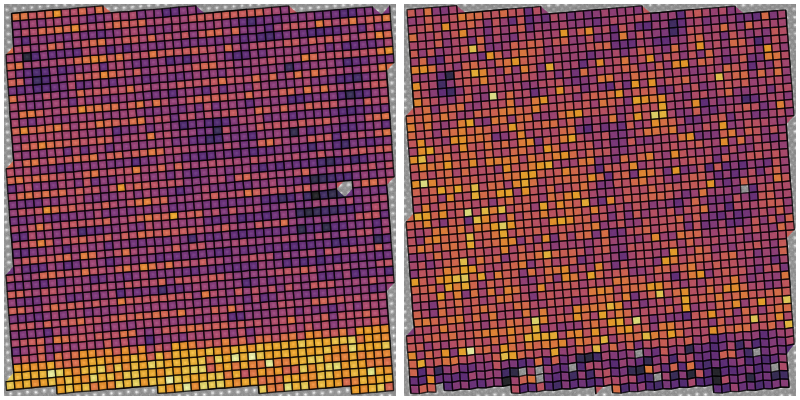

In [96]:
fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,4))
ax[0].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_polygons(ax[0],( cf[A,:]+v_AtoBs ),column_intensity[A],alpha=.75,linewidth=1)
ax[0].axis('off')

ax[1].matshow(image,cmap='gray',alpha=.5)
kemstem.plot_scalar_polygons(ax[1],( cf[B,:]+v_BtoAs ),column_intensity[B],alpha=.75,linewidth=1)
ax[1].axis('off')

# Identifying connected points and calculating profiles
Below, chains of atomic columns connected by the in-plane and out-of-plane vectors found previously are found. Such sets of columns can be useful for a number of analyses, here we'll use them to calculate line profiles.

(-0.5, 1016.5, 1016.5, -0.5)

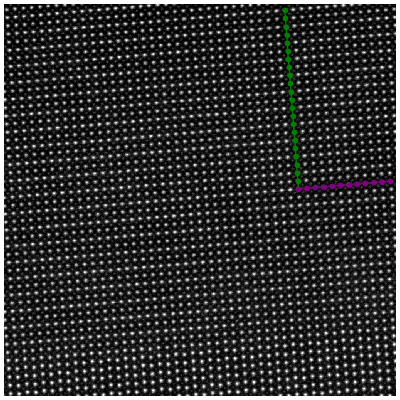

In [110]:
# Finding the A-site column closest to a point of interest.
# the corersponding B-site column could be readily found by changing cf[A,:] to cf[B,:]
origin = (488,771)
origin_A,_,_ = kemstem.util.get_nearest_points(cf[A,:],origin,k=1)

# getting the columns connected to this point by guess_2, the out of plane lattice vector
# here, only the columns connected by translating by positive guess_2 are found because the 
# bidirectional=False argument is passed.
# This function also returns the index of the origin, which can be useful in some cases but here 
# is not used.
vert_As, vert_o_idx = kemstem.get_connected_columns(cf[A,:], origin_A, guess_2, 3,bidirectional=False)
horz_As, horz_o_idx = kemstem.get_connected_columns(cf[A,:], origin_A, guess_1, 3,bidirectional=False)

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
ax.matshow(image,cmap='gray',vmin=0.1,vmax=0.8)
ax.plot(vert_As[:,1],vert_As[:,0],'.-',color='g',linewidth=1)
ax.plot(horz_As[:,1],horz_As[:,0],'.-',color='purple',linewidth=1)
ax.axis('off')

Next, we cut off the chain after a chosen number of sites, and calculate the image intensity profile from the first to the last site of each chain (with a small extrapolation)

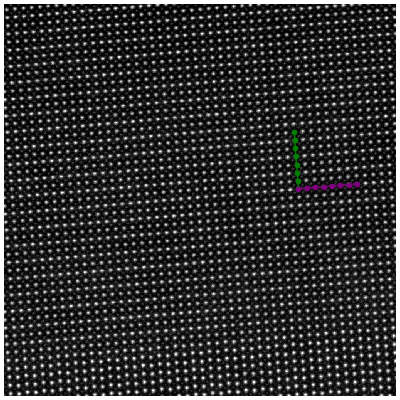

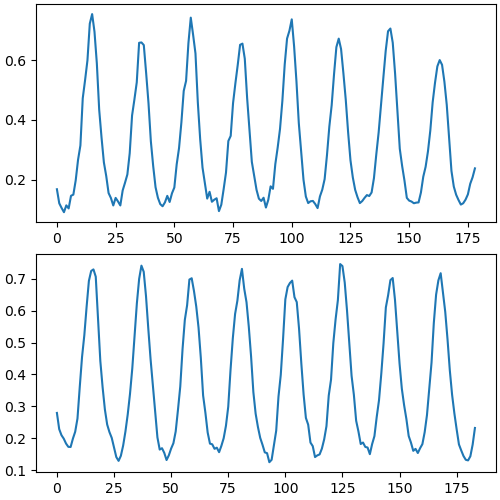

In [119]:
n_col_in_prof = 8
extr_frac = 0.1
prof_width = 3

vert_As = kemstem.get_connected_columns(cf[A,:], origin_A, guess_2, 3,bidirectional=False)[0]
vert_As = vert_As[0:n_col_in_prof,:]
extrVA = np.array(kemstem.extrapolate_point_pair(vert_As[0,:],vert_As[-1,:],extr_frac,extr_frac))
profVA = skimage.measure.profile_line(image,extrVA[0],extrVA[1],linewidth=prof_width)

horz_As = kemstem.get_connected_columns(cf[A,:], origin_A, guess_1, 3,bidirectional=False)[0]
horz_As = horz_As[0:n_col_in_prof,:]
extrHA = np.array(kemstem.extrapolate_point_pair(horz_As[0,:],horz_As[-1,:],extr_frac,extr_frac))
profHA = skimage.measure.profile_line(image,extrHA[0],extrHA[1],linewidth=prof_width)

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
ax.matshow(image,cmap='gray',vmin=0.1,vmax=0.8)
ax.axis('off')
ax.plot(vert_As[:,1],vert_As[:,0],'.-',color='g',linewidth=1)
ax.plot(horz_As[:,1],horz_As[:,0],'.-',color='purple',linewidth=1)

fig,ax = plt.subplots(2,1,constrained_layout=True,figsize=(5,5))
ax[0].plot(profVA)
ax[1].plot(profHA)